In [1]:
# %load_ext cudf.pandas
# %load_ext cuml.accel

In [2]:
import os
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

try:
    import catboost as cgb
except:
    %pip install catboost
    import catboost as cgb
import xgboost as xgb
import lightgbm as lgb

try:
    from cir_model import CenteredIsotonicRegression
except:
    %pip install -qq -U cir-model
    from cir_model import CenteredIsotonicRegression

from sklearn.isotonic import IsotonicRegression
from cir_model import CenteredIsotonicRegression

from sklearn.linear_model import LinearRegression, Ridge, RidgeCV, Lasso, ElasticNet
from sklearn.ensemble import RandomForestRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.svm import SVR, LinearSVR

from sklearn.metrics import mean_squared_error, PredictionErrorDisplay
from sklearn.model_selection import KFold

from tqdm.notebook import tqdm
from time import time
import warnings

def rmse(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

warnings.simplefilter("ignore")
warnings.filterwarnings("ignore", category=FutureWarning)

pd.set_option("display.max_columns", None)
COLOR = "\033[33m"
RESET = "\033[0m"

Note: you may need to restart the kernel to use updated packages.


## 1.__LOAD DATA

In [3]:
oof_df = pd.DataFrame()
pred_df = pd.DataFrame()

for (root, dirs, files) in tqdm(os.walk("/kaggle/input/s5e9-beats-oof"), desc="Loading data"):
    for file in sorted(files):
        if file.endswith(".parquet") and "oof" in file:
            oof_df = pd.concat([oof_df, pd.read_parquet(os.path.join(root, file))], axis=1)
        elif file.endswith(".parquet") and "pred" in file:
            pred_df = pd.concat([pred_df, pd.read_parquet(os.path.join(root, file))], axis=1)

print(f"{COLOR}Total OOF models  : {len(oof_df.columns)}")
print(f"Total PREDS models: {len(pred_df.columns)}")

Loading data: 0it [00:00, ?it/s]

Total OOF models  : 430
Total PREDS models: 430


In [4]:
def rename_duplicate_cols(df: pd.DataFrame) -> pd.DataFrame:
    original_cols = list(df.columns)
    new_cols = []
    # Track how many times we've seen each original name
    seen = {}

    for col in tqdm(original_cols, desc="Fixing columns"):
        if col not in seen:
            # First occurrence: keep name unchanged
            seen[col] = 1
            new_cols.append(col)
        else:
            # Duplicate: append suffix _k where k starts at 0
            suffix = seen[col] - 1 # 0 for first duplicate, 1 for second,
            new_name = f"{col}_{suffix}"
            new_cols.append(new_name)
            seen[col] += 1

    # Apply new column names
    df = df.copy()
    df.columns = new_cols
    print(f"{COLOR}Columns fixed!!!{RESET}")

    return df

oof_df = rename_duplicate_cols(oof_df)
pred_df = rename_duplicate_cols(pred_df)

Fixing columns:   0%|          | 0/430 [00:00<?, ?it/s]

Columns fixed!!!


Fixing columns:   0%|          | 0/430 [00:00<?, ?it/s]

Columns fixed!!!


In [5]:
train  = pd.read_csv("/kaggle/input/playground-series-s5e9/train.csv", index_col='id')
submit = pd.read_csv("/kaggle/input/playground-series-s5e9/sample_submission.csv")
TARGET = "BeatsPerMinute"
y      = train[TARGET]

print(f"""
        ---> Train shape : {train.shape}
        ---> OOF shape   : {oof_df.shape}
        ---> PRED shape  : {pred_df.shape}
""")


        ---> Train shape : (524164, 10)
        ---> OOF shape   : (524164, 430)
        ---> PRED shape  : (174722, 430)



In [6]:
# CIR_oof_df = pd.DataFrame()
# CIR_pred_df = pd.DataFrame()
# for c in oof_df.columns:
#     CIR = CenteredIsotonicRegression(out_of_bounds='clip').fit(oof_df[c], y)
#     CIR_oof_df[c]  = CIR.transform(oof_df[c])
#     CIR_pred_df[c] = CIR.transform(pred_df[c])

# IR_oof_df = pd.DataFrame()
# IR_pred_df = pd.DataFrame()
# for c in oof_df.columns:
#     IR = IsotonicRegression(out_of_bounds='clip').fit(oof_df[c], y)
#     IR_oof_df[c]  = IR.transform(oof_df[c])
#     IR_pred_df[c] = IR.transform(pred_df[c])

# CIR, IR

# fig, axs = plt.subplots(1, 3, figsize=(20, 5))
# sns.histplot(oof_df.iloc[:, 0], ax=axs[0]).set_title("Original")
# sns.histplot(IR_oof_df.iloc[:, 0], ax=axs[1]).set_title("Isotonic Regression")
# sns.histplot(CIR_oof_df.iloc[:, 0], ax=axs[2]).set_title("Centered Isotonic Regression")
# plt.show()

# pd.concat([oof_df.iloc[:, 0], IR_oof_df.iloc[:, 0], CIR_oof_df.iloc[:, 0]], axis=1).head()

# STACKING

Training Ridge with alphas: [0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.11, 0.12, 0.13, 0.14, 0.15]

[1] Training with alpha: 0.05 --------------------
Fold 1 alpha: 0.05 | rmse: 26.387073
Fold 2 alpha: 0.05 | rmse: 26.414665
Fold 3 alpha: 0.05 | rmse: 26.488772
Fold 4 alpha: 0.05 | rmse: 26.431630
Fold 5 alpha: 0.05 | rmse: 26.483094
Fold 6 alpha: 0.05 | rmse: 26.495923
Fold 7 alpha: 0.05 | rmse: 26.417603
Fold 8 alpha: 0.05 | rmse: 26.401353
Fold 9 alpha: 0.05 | rmse: 26.373511
Fold 10 alpha: 0.05 | rmse: 26.387744
alpha 0.05 -> avg. rmse: 26.428137 ± 0.043146

[2] Training with alpha: 0.06 --------------------
Fold 1 alpha: 0.06 | rmse: 26.387066
Fold 2 alpha: 0.06 | rmse: 26.414664
Fold 3 alpha: 0.06 | rmse: 26.488772
Fold 4 alpha: 0.06 | rmse: 26.431634
Fold 5 alpha: 0.06 | rmse: 26.483094
Fold 6 alpha: 0.06 | rmse: 26.495923
Fold 7 alpha: 0.06 | rmse: 26.417606
Fold 8 alpha: 0.06 | rmse: 26.401353
Fold 9 alpha: 0.06 | rmse: 26.373511
Fold 10 alpha: 0.06 | rmse: 26.387743
alpha 0.06 -> 

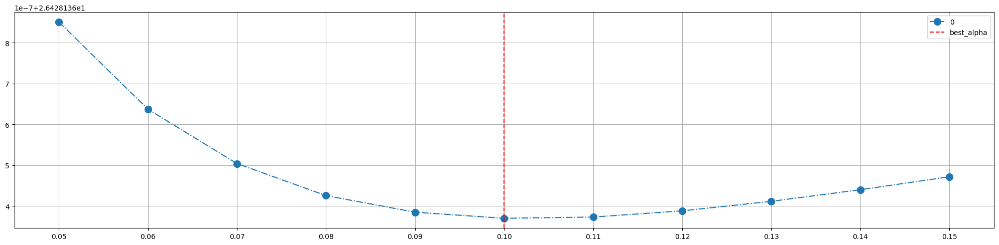

In [7]:
## -- Stacking with Ridge --
SEED = 42
kf = KFold(n_splits=10, shuffle=True, random_state=SEED)

alphas = [np.round(x, 3) for x in np.arange(0.05, 0.16, 0.01)]
cv_RMSE_Scores = []
print(f"Training Ridge with alphas: {alphas}")
for i, alpha in enumerate(alphas, 1):
    print(f"\n{COLOR}[{i}] Training with alpha: {alpha} {'-'*20}{RESET}")
    RMSE_Scores = []
    for j, (train_idx, val_idx) in enumerate(kf.split(oof_df), 1):
        X_tr, X_val = oof_df.iloc[train_idx], oof_df.iloc[val_idx]
        y_tr, y_val = y.iloc[train_idx], y.iloc[val_idx]

        model = Ridge(
                    # max_iter=5000,
                    # positive=True,
                    # solver='lbfgs',
                    alpha=alpha,
                    random_state=SEED,
                )
        model.fit(X_tr, y_tr)
        preds = model.predict(X_val)
        # preds = np.clip(preds, 0, 1)
        
        score = rmse(y_val, preds)
        RMSE_Scores.append(score)
        print(f"Fold {j} alpha: {alpha} | rmse: {score:.6f}")

    cv_RMSE_Scores.append(np.mean(RMSE_Scores))
    print(f"{COLOR}alpha {alpha} -> avg. rmse: {np.mean(RMSE_Scores):.6f} ± {np.std(RMSE_Scores):.6f}{RESET}")
    print(f"{'='*50}")

best_alpha = alphas[np.argmin(cv_RMSE_Scores)]
best_score = np.round(np.min(cv_RMSE_Scores), 6)
print(f"{COLOR}Best Alpha: {best_alpha} || RMSE: {best_score}{RESET}")
print(f"{'='*50}")

## -- Plot alpha/scores --
pd.DataFrame.from_dict(dict(zip(alphas, cv_RMSE_Scores)), orient='index')\
.plot(figsize=(20, 5), marker='o', markersize=10, linestyle='-.')
plt.axvline(best_alpha, color='r', linestyle='--', label='best_alpha')
plt.legend()
plt.xticks(alphas)
plt.grid()
plt.tight_layout()
plt.show()

In [8]:
## -- Final predictions with best alpha --
ridge_ = Ridge(alpha=best_alpha, random_state=SEED)
ridge_.fit(oof_df, y)
print(ridge_)
ridge_preds = ridge_.predict(pred_df)
# stack_preds = np.clip(ridge_preds, 0, 1)

submit[TARGET] = ridge_preds
submit.to_csv("submit_stack_ridge.csv", index=False)
submit.head()

Ridge(alpha=0.1, random_state=42)


,id,BeatsPerMinute
0,524164,119.443487
1,524165,119.376696
2,524166,119.347486
3,524167,120.649439
4,524168,120.127942


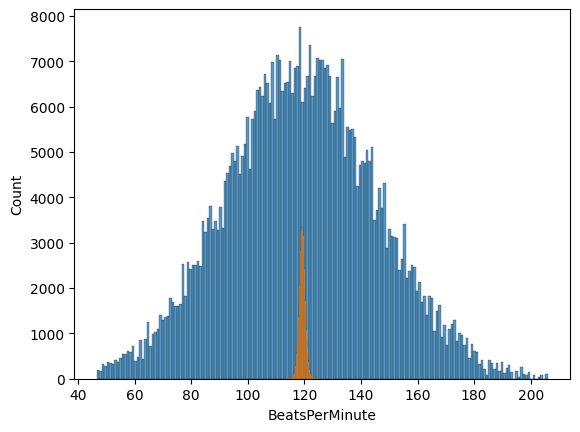

In [9]:
sns.histplot(y)
sns.histplot(ridge_preds)
plt.show()

In [10]:
# ## -- TRAIN WITH RIDGE CV AS META-MODEL --
# kf = KFold(n_splits=10, shuffle=True, random_state=42)

# ridgeCV = RidgeCV(
#             alphas  = np.arange(.05, .16, .01), cv = kf,
#             scoring = 'neg_root_mean_squared_error',
#     )
# ridgeCV.fit(TOP_OOF, y)

# ## -- Evaluate the stacking model on the oof --
# print(f"-> R^2 Score      : {ridgeCV.score(TOP_OOF, y):.6f}")
# print(f"-> Selected alpha : {ridgeCV.alpha_}")
# print(f"-> Best Score     : {ridgeCV.best_score_}\n")
# ridgeCV_preds = ridgeCV.predict(TOP_PRED)
# ridgeCV_preds

## -- Create submission file --
# submit[TARGET] = ridgeCV_preds
# submit.to_csv("submission_stack_ridgeCV.csv", index=False)
# print(submit.head())

# ridgeCV_dict = dict(zip(oof_df.columns, ridgeCV.coef_))
# ridgeCV_df = pd.DataFrame.from_dict(ridgeCV_dict, orient='index')
# ridgeCV_df.plot(kind='barh', cmap='Spectral', figsize=(18, 20))
# plt.grid(axis='y')
# plt.show()

In [11]:
# top_models = [
#         'WeightedEnsembleL3_FE185rfx_CPU',
#         'RandomForestMSEBAGL2_FE185rfx__CPU',
#         'RandomForestMSEBAGL2_FE185rfx_GPU',
#         'RandomForestMSEBAGL2_FEnums184_CPU',
#         'RandomForestMSEBAGL2_FE185__CPU',
#         'RandomForestMSEBAGL2_FE195_CPU',
#         'RandomForestMSEBAGL2_FE185rfx_CPU',
#         'RandomForestMSEBAGL2_FE194_CPU',
#         'RandomForestMSEBAGL2_FE99rlfx_CPU',
#         'RandomForestMSEBAGL2_FE185rlfx_CPU',
#         'ExtraTreesMSEBAGL2_FE185rlfx_CPU',
#         'RandomForestMSEBAGL2_FE185_GPU',
#         'ExtraTreesMSEBAGL2_FE185rfx_CPU',
#         'ExtraTreesMSEBAGL2_FE90_CPU',
# ]

# TOP_OOF = oof_df[top_models]
# TOP_PRED= pred_df[top_models]

# HILL CLIMBING

In [12]:
try:
    from hillclimbers import climb_hill, partial
except:
    %pip install -qq hillclimbers
    from hillclimbers import climb_hill, partial

  Preparing metadata (setup.py) ... done
Note: you may need to restart the kernel to use updated packages.


In [13]:
%%time
phc_pred, phc_oof = climb_hill(
                            train            = train,
                            target           = TARGET,
                            oof_pred_df      = oof_df,
                            test_pred_df     = pred_df,
                            objective        = "minimize",
                            eval_metric      = partial(rmse),
                            negative_weights = False,
                            return_oof_preds = True,
                            precision        = 0.01,
                            plot_hill        = True,
                            plot_hist        = True,
    )

   /\  
  /__\  hillclimbers 
 /    \
/______\ 

Models to be ensembled | (430 total): 

WeightedEnsembleL3_FE185--rfx_CPU:      26.44854 (best solo model)
WeightedEnsembleL3_FE185rfx_CPU:        26.45070
WeightedEnsembleL3_FE185rfx_GPU:        26.45167
WeightedEnsembleL3_FE185rfx__CPU:       26.45294
WeightedEnsembleL3_FEnums184_CPU:       26.45318
WeightedEnsembleL3_FE185rlfx_CPU:       26.45360
WeightedEnsembleL3_FE185__CPU:          26.45377
WeightedEnsembleL3_FE99rlfx_CPU:        26.45379
WeightedEnsembleL3_FE195_CPU:           26.45473
WeightedEnsembleL3_FE185rlf_CPU:        26.45475
WeightedEnsembleL3_FE185_GPU:           26.45523
WeightedEnsembleL3_FE194_CPU:           26.45546
WeightedEnsembleL3_FE194xlc_CPU:        26.45568
WeightedEnsembleL3_FE81_CPU:            26.45581
WeightedEnsembleL3_FE257_CPU:           26.45592
WeightedEnsembleL3_FE90_CPU:            26.45604
WeightedEnsembleL3_FE81rlfx_CPU:        26.45612
CatBoostBAGL2_FE81_CPU:                 26.45640
WeightedEns

CPU times: user 44min 42s, sys: 8.2 s, total: 44min 51s
Wall time: 22min 30s


In [14]:
print(f"Mean: {np.mean(y)} | {np.mean(phc_oof)} | {np.mean(phc_pred)}") 
print(f"Median: {np.median(y)} | {np.median(phc_oof)} | {np.median(phc_pred)}") 
np.save('pHC_OOF.npy', phc_oof); print(f"--> Saving hillclimb OOF...Complete!")
np.save('pHC_PRED.npy', phc_pred); print(f"--> Saving hillclimb PREDS... Complete!")
submit[TARGET] = phc_pred
submit.to_csv("submit_phc.csv", index=False); print(f"--> Saving submission... Complete!")
submit.head(10)

Mean: 119.03489938795873 | 119.05785369873047 | 119.22273254394531
Median: 118.74766 | 119.01139068603516 | 119.19602966308594
--> Saving hillclimb OOF...Complete!
--> Saving hillclimb PREDS... Complete!
--> Saving submission... Complete!


,id,BeatsPerMinute
0,524164,119.044853
1,524165,119.160851
2,524166,119.466606
3,524167,120.087654
4,524168,119.865807
5,524169,118.333954
6,524170,118.443405
7,524171,118.608253
8,524172,119.952568
9,524173,118.554863


In [15]:
%%time
nhc_pred, nhc_oof = climb_hill(
                            train            = train,
                            target           = TARGET,
                            oof_pred_df      = oof_df,
                            test_pred_df     = pred_df,
                            objective        = "minimize",
                            eval_metric      = partial(rmse),
                            negative_weights = True,
                            return_oof_preds = True,
                            precision        = 0.01,
                            plot_hill        = True,
                            plot_hist        = True,
    )

   /\  
  /__\  hillclimbers 
 /    \
/______\ 

Models to be ensembled | (430 total): 

WeightedEnsembleL3_FE185--rfx_CPU:      26.44854 (best solo model)
WeightedEnsembleL3_FE185rfx_CPU:        26.45070
WeightedEnsembleL3_FE185rfx_GPU:        26.45167
WeightedEnsembleL3_FE185rfx__CPU:       26.45294
WeightedEnsembleL3_FEnums184_CPU:       26.45318
WeightedEnsembleL3_FE185rlfx_CPU:       26.45360
WeightedEnsembleL3_FE185__CPU:          26.45377
WeightedEnsembleL3_FE99rlfx_CPU:        26.45379
WeightedEnsembleL3_FE195_CPU:           26.45473
WeightedEnsembleL3_FE185rlf_CPU:        26.45475
WeightedEnsembleL3_FE185_GPU:           26.45523
WeightedEnsembleL3_FE194_CPU:           26.45546
WeightedEnsembleL3_FE194xlc_CPU:        26.45568
WeightedEnsembleL3_FE81_CPU:            26.45581
WeightedEnsembleL3_FE257_CPU:           26.45592
WeightedEnsembleL3_FE90_CPU:            26.45604
WeightedEnsembleL3_FE81rlfx_CPU:        26.45612
CatBoostBAGL2_FE81_CPU:                 26.45640
WeightedEns

CPU times: user 21h 36min 21s, sys: 3min, total: 21h 39min 22s
Wall time: 10h 51min 15s


In [16]:
print(f"Mean: {np.mean(y)} | {np.mean(nhc_oof)} | {np.mean(nhc_pred)}") 
print(f"Median: {np.median(y)} | {np.median(nhc_oof)} | {np.median(nhc_pred)}") 
np.save('nHC_OOF.npy', nhc_oof); print(f"-> Saving hillclimb OOF...Complete!")
np.save('nHC_PRED.npy', nhc_pred); print(f"-> Saving hillclimb PREDS... Complete!")
submit[TARGET] = nhc_pred
submit.to_csv("submit_nhc.csv", index=False); print(f"-> Saving submission... Complete!")
submit.head(10)

Mean: 119.03489938795873 | 119.0549946427211 | 119.30266159812578
Median: 118.74766 | 118.99075167483358 | 119.2620018607965
-> Saving hillclimb OOF...Complete!
-> Saving hillclimb PREDS... Complete!
-> Saving submission... Complete!


,id,BeatsPerMinute
0,524164,119.243863
1,524165,119.381002
2,524166,119.602346
3,524167,120.675725
4,524168,120.158293
5,524169,118.152995
6,524170,118.066879
7,524171,118.367477
8,524172,120.220179
9,524173,118.608711


## HC-2

In [17]:
# try:
#     from hill_climbing import Climber, ClimberCV
# except:
#     !pip install -qq hill-climbing
#     from hill_climbing import Climber, ClimberCV

# climber = Climber(
#                 objective="minimize",
#                 eval_metric=rmse,
#                 allow_negative_weights=False,
#                 precision=0.01,
#                 score_decimal_places=6,
#                 # use_gpu=True,
#             )

# climber.fit(oof_df, train[TARGET])
# climb_preds = climber.predict(pred_df)
# submit[TARGET] = climb_preds
# submit.to_csv("submission_hc2.csv", index=False)
# submit.head()

In [18]:
# ## -- Stacking --
# def regularization_trainer(
#                 model_type="ridge",
#                 oof_df=oof_df,
#                 pred_df=pred_df,
#                 y_true=y,
#                 alphas=None,
#                 n_splits=10,
#                 seed=42,
#             ):
    
#     kf = KFold(n_splits=n_splits, shuffle=True, random_state=seed)
#     cv_Scores = []
#     alphas = [np.round(x, 3) for x in alphas]
#     print(f"""
#     =================================
#     MODEL SELECT    : {model_type.upper()}
#     CROSS-VAL FOLDS : {n_splits}
#     =================================
#     """)
#     for i, alpha in enumerate(alphas, 1):
#         Scores = []
#         print(f"\n{COLOR}[{i}] Training alpha: {alpha} {'-'*20}{RESET}")
#         for j, (train_idx, val_idx) in enumerate(kf.split(oof_df), 1):
#             X_tr, X_val = oof_df.iloc[train_idx], oof_df.iloc[val_idx]
#             y_tr, y_val = y_true.iloc[train_idx], y_true.iloc[val_idx]
    
#             if model_type == "ridge":
#                 model = Ridge(alpha=alpha, random_state=seed)
#             elif model_type == "lasso":
#                 model = Lasso(alpha=alpha, random_state=seed)
#             elif model_type == "elastic":
#                 model = ElasticNet(alpha=alpha, random_state=seed, selection="random")
#             elif model_type == "mlp":
#                 model = MLPRegressor(alpha=alpha, random_state=seed)
            
#             model.fit(X_tr, y_tr)
#             score = rmse(y_val, model.predict(X_val))
#             Scores.append(score)
#             if j%5==0: print(f"Fold {j} alpha: {alpha} | rmse: {score:.6f}")
    
#         cv_Scores.append(np.mean(Scores))
#         print(f"{COLOR}alpha {alpha} -> avg.rmse: {np.mean(Scores):.6f} ± {np.std(Scores):.6f}{RESET}")
#         print(f"{'='*45}")
    
#     best_alpha = alphas[np.argmin(cv_Scores)]
#     best_score = np.round(np.min(cv_Scores), 6)
#     print(f"{COLOR}Best Alpha: {best_alpha} || RMSE: {best_score}{RESET}")
#     print(f"{'='*45}")
    
#     ## -- Plot alpha/scores --
#     pd.DataFrame.from_dict(dict(zip(alphas, cv_Scores)), orient='index')\
#     .plot(figsize=(18, 5), marker='o', markersize=10, linestyle='-.')
#     plt.axvline(best_alpha, color='r', linestyle='--', label='best_alpha')
#     plt.legend()
#     plt.xticks(alphas)
#     plt.text(x=best_alpha+1e-3, y=best_score, s=best_score)
#     plt.grid()
#     plt.tight_layout()
#     plt.show()

#     ## -- Final predictions with best alpha --
#     if model_type == "ridge":
#         stack_model = Ridge(alpha=best_alpha, random_state=seed)
#     elif model_type == "lasso":
#         stack_model = Lasso(alpha=best_alpha, random_state=seed)
#     elif model_type == "elastic":
#         stack_model = ElasticNet(alpha=best_alpha, random_state=seed, selection="random")
        
#     stack_model.fit(oof_df, y_true)
#     stack_preds = stack_model.predict(pred_df)
#     # stack_preds = np.clip(stack_preds, 0, 1)
    
#     ## -- Evaluate the stacking model on the oof --
#     oof_stack_preds = stack_model.predict(oof_df)
#     oof_stack_rmse = rmse(y_true, oof_stack_preds)
    
#     ## -- Create submission file --
#     VALUE = np.round(oof_stack_rmse, 6).astype(str).split(".")[1]
#     FILE_NAME = f"submit_stack_{model_type}{VALUE}.csv"
#     submit[TARGET] = stack_preds
#     submit.to_csv(FILE_NAME, index=False)
#     print(f"""
#     ===============================================
#     MODEL PARAMS : {stack_model}
#     FINAL SCORE  : {oof_stack_rmse:.6f}
#     CV AVERAGE   : {np.mean(stack_preds)}
#     TRUE AVERAGE : {np.mean(y_true)}
#     FILE SAVED   : {FILE_NAME}
#     ===============================================
#     """)
#     display(submit.head())

In [19]:
# regularization_trainer("ridge", alphas=np.arange(0.05, 0.16, 0.01))

In [20]:
# meta_models = {
#     'RIDGE': Ridge(random_state=31),
#     'XGB': xgb.XGBRegressor(n_jobs=-1, random_state=31),
#     'LGBM': lgb.LGBMRegressor(random_state=42, verbose=-1, n_jobs=-1),
#     'CAT': cgb.CatBoostRegressor(random_state=42, verbose=0, thread_count=-1),
#     'RF': RandomForestRegressor(random_state=42, n_jobs=-1),
#     'MLP': MLPRegressor(random_state=31),
#     'LR': LinearRegression(n_jobs=-1),
#     'svr': LinearSVR(C=0.5, loss='squared_epsilon_insensitive', random_state=31),
# }

In [21]:
# # # ==============================
# # # TRAIN AND COMPARE META-MODELS
# # # ==============================

# oof_final_df = pd.DataFrame()
# test_final_df = pd.DataFrame()
# kf = KFold(n_splits=10, shuffle=True, random_state=31)

# for i, (name, model) in tqdm(enumerate(meta_models.items(), 1), total=len(meta_models), desc="TRAINING META-MODELS"):
#     print(f"\n{COLOR}[{i}] {name} {'#'*40}{RESET}")
#     tik = time()

#     oof_preds = np.zeros(len(oof_df))
#     test_preds = np.zeros(len(pred_df))
#     fold_RMSEs = []
#     fold_LOSS = []

#     for fold, (train_idx, val_idx) in enumerate(kf.split(oof_df, y), 1):
#         X_train_fold,\
#         X_val_fold = oof_df.iloc[train_idx], oof_df.iloc[val_idx]
#         y_train_fold,\
#         y_val_fold = y.iloc[train_idx], y.iloc[val_idx]

#         model.fit(X_train_fold, y_train_fold)
#         y_val_preds = model.predict(X_val_fold)
#         # y_val_preds = np.clip(y_val_preds, 0, 1)
#         oof_preds[val_idx] = y_val_preds

#         score = rmse(y_val_fold, y_val_preds)
#         fold_RMSEs.append(score)
#         # loss = log_loss(y_val_fold, y_val_preds)
#         # fold_LOSS.append(loss)
        
#         print(f"\tFold {fold} RMSE: {score:.6f}")

#         preds = model.predict(pred_df)
#         # preds = np.clip(preds, 0, 1) # Clip 0-1
#         test_preds += preds / kf.n_splits

#     ## -- After all folds:
#     overall_RMSE = rmse(y, oof_preds)
#     # overall_LOSS = log_loss(y, oof_preds)
#     print(f"|{'-'*52}")

#     print(f"{COLOR}|  Overall OOF RMSE: {overall_RMSE:.6f}")
#     print(f"| Average Fold RMSE: {np.mean(fold_RMSEs):.6f} ± {np.std(fold_RMSEs):.6f}{RESET}")

#     ## -- Plot predictions errors --
#     fig, axs = plt.subplots(1, 2, figsize=(20, 5))
#     display = PredictionErrorDisplay.from_predictions(
#                     y, oof_preds, ax=axs[0],
#                     # kind="actual_vs_predicted",
#                     # subsample=2_000,
#                     scatter_kwargs={"alpha": 0.5},
#                     line_kwargs={'color': 'r'},
#     )
#     axs[0].set_title(f"Scatter Plots - {name}")
#     ## ---------------------------------------------------------------------
#     plt.hist(oof_preds, bins=200, density=True, ec='k', color='lightgreen')
#     axs[1].set_title(f"Distribution of OOF Predictions - {name}")
#     ## ---------------------------------------------------------------------
#     for ax in axs:
#         ax.grid(False)
#     plt.tight_layout()
#     plt.show()

#     oof_final_df[name] = oof_preds
#     test_final_df[name] = test_preds

#     tok = time()
#     tiktok = tok-tik
#     print(f"{'#'*10} Computation Time: {tiktok:.2f} secs {'#'*100}")

# submit["y"] = test_final_df
# submit.to_csv("submission_stack_ridge1.csv", index=False)
# submit.head() 